In [1]:
import os
import sys
EXLIB_DIR = "../src"
ABDX_DIR = "../data/abdomen"
cwd = os.getcwd()
print(cwd)

sys.path.append(EXLIB_DIR)
DATA_DIR = ABDX_DIR

# sys.path.append('/shared_data0/weiqiuy/real_drs')

from exlib.datasets.abdomen_organs import AbdomenOrgans, OrganGNGSopSelectorModel, miou, dice_acc, mpa
# from organs.models import OrganGNGModel, Unet, convert_idx_masks_to_bool
# from organs.train_organ_mask_gonogo_sop import *

from exlib.modules.sop import SOPImageSeg, SOPConfig, get_chained_attr
import torch
import torch.nn.functional as F

from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from collections import namedtuple

/shared_data0/weiqiuy/exlib/notebooks


In [2]:
import torch
state_dict = torch.load('../saved_models/sopsel_pto_ptgng_fzo_lr_0.01newhello_best.pt')

In [3]:
model = OrganGNGSopSelectorModel(wrapper_config_filepath='configs/abdomen_organ_sop_gonogo.json')
test_dataset = AbdomenOrgans(DATA_DIR, split="test", image_height=352)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(state_dict['model_state_dict'])
model = model.to(device)
model.eval();

wrapper_config_filepath configs/abdomen_organ_sop_gonogo.json
projection layer is not frozen


In [4]:
from torch.utils.data import DataLoader

test_dataloader_bsz1 = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [7]:
def test_one_epoch_bsz1(model, dataloader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    running_total = 0

    miou_fn_organ = lambda x1, l1: miou(x1.argmax(dim=1).byte(), l1.squeeze(1), class_num=4)
    miou_fn_gonogo = lambda x2, l2: miou(x2.argmax(dim=1).byte(), l2.squeeze(1), class_num=3)
    miou_fn = lambda x1, l1, x2, l2 : (miou_fn_organ(x1, l1) + miou_fn_gonogo(x2, l2)) / 2

    mpa_fn_organ = lambda x1, l1: mpa(x1.argmax(dim=1).byte(), l1.squeeze(1), class_num=4)
    mpa_fn_gonogo = lambda x2, l2: mpa(x2.argmax(dim=1).byte(), l2.squeeze(1), class_num=3)
    mpa_fn = lambda x1, l1, x2, l2 : (mpa_fn_organ(x1, l1) + mpa_fn_gonogo(x2, l2)) / 2

    dice_fn_organ = lambda x1, m1: dice_acc((x1 > 0.5).byte(), m1)
    dice_fn_gonogo = lambda x2, m2: dice_acc((x2 > 0.5).byte(), m2)
    dice_fn = lambda x1, m1, x2, m2 : (dice_fn_organ(x1, m1) + dice_fn_gonogo(x2, m2)) / 2

    running_miou, running_mpa, running_dice = 0., 0., 0.
    running_miou_organ, running_mpa_organ, running_dice_organ = 0., 0., 0.
    running_miou_gonogo, running_mpa_gonogo, running_dice_gonogo = 0., 0., 0.
    running_miou_gonogo_raw, running_mpa_gonogo_raw, running_dice_gonogo_raw = 0., 0., 0.
    running_miou_gonogo_sop_vs_raw, running_mpa_gonogo_sop_vs_raw, running_dice_gonogo_sop_vs_raw = 0., 0., 0.
    miou_organs = []
    mpa_organs = []
    dice_organs = []
    miou_gonogos = []
    mpa_gonogos = []
    dice_gonogos = []
    miou_gonogos_raw = []
    mpa_gonogos_raw = []
    dice_gonogos_raw = []
    miou_gonogos_sop_vs_raw = []
    mpa_gonogos_sop_vs_raw = []
    dice_gonogos_sop_vs_raw = []
    
    
    pbar = tqdm(dataloader)
    with torch.no_grad():
        for i, batch in enumerate(pbar):
            image, organ_label, gonogo_label = batch
            image, organ_label, gonogo_label = image.float().to(device), organ_label.to(device), gonogo_label.to(device)
            organ_mask = F.one_hot(organ_label.squeeze(1).long(), num_classes=4).permute(0,3,1,2).to(device)
            gonogo_mask = F.one_hot(gonogo_label.squeeze(1).long(), num_classes=3).permute(0,3,1,2).to(device)
            organ_output, gonogo_output = model(image, get_organs=True)
            gonogo_output_raw = model.gonogo_model(image)

            if not isinstance(organ_output, torch.Tensor):
                organ_output = organ_output.logits
            if not isinstance(gonogo_output, torch.Tensor):
                gonogo_output = gonogo_output.logits
            if not isinstance(gonogo_output_raw, torch.Tensor):
                gonogo_output_raw = gonogo_output_raw.logits
            
            gonogo_output = torch.softmax(gonogo_output, dim=1)
            gonogo_output_raw = torch.softmax(gonogo_output_raw, dim=1)
            gonogo_output_raw_label = gonogo_output_raw.argmax(dim=1, keepdim=True).byte()
        
            miou_val = miou_fn(organ_output, organ_label, gonogo_output, gonogo_label)
            mpa_val = mpa_fn(organ_output, organ_label, gonogo_output, gonogo_label)
            dice_val = dice_fn(organ_output, organ_mask, gonogo_output, gonogo_mask)
            miou_val_organ = miou_fn_organ(organ_output, organ_label)
            mpa_val_organ = mpa_fn_organ(organ_output, organ_label)
            dice_val_organ = dice_fn_organ(organ_output, organ_mask)
            running_miou_organ += miou_val_organ.item() * image.size(0)
            running_mpa_organ += mpa_val_organ.item() * image.size(0)
            running_dice_organ += dice_val_organ.item() * image.size(0)

            miou_val_gonogo = miou_fn_gonogo(gonogo_output, gonogo_label)
            mpa_val_gonogo = mpa_fn_gonogo(gonogo_output, gonogo_label)
            dice_val_gonogo = dice_fn_gonogo(gonogo_output, gonogo_mask)
            running_miou_gonogo += miou_val_gonogo.item() * image.size(0)
            running_mpa_gonogo += mpa_val_gonogo.item() * image.size(0)
            running_dice_gonogo += dice_val_gonogo.item() * image.size(0)
            
            miou_val_gonogo_raw = miou_fn_gonogo(gonogo_output_raw, gonogo_label)
            mpa_val_gonogo_raw = mpa_fn_gonogo(gonogo_output_raw, gonogo_label)
            dice_val_gonogo_raw = dice_fn_gonogo(gonogo_output_raw, gonogo_mask)
            running_miou_gonogo_raw += miou_val_gonogo_raw.item() * image.size(0)
            running_mpa_gonogo_raw += mpa_val_gonogo_raw.item() * image.size(0)
            running_dice_gonogo_raw += dice_val_gonogo_raw.item() * image.size(0)
            
            # print('gonogo_output_raw_label', gonogo_output_raw_label.shape)
            # print('gonogo_output', gonogo_output.shape)
            # print('gonogo_label', gonogo_label.shape)
            miou_val_gonogo_sop_vs_raw = miou_fn_gonogo(gonogo_output, gonogo_output_raw_label)
            mpa_val_gonogo_sop_vs_raw = mpa_fn_gonogo(gonogo_output, gonogo_output_raw_label)
            dice_val_gonogo_sop_vs_raw = dice_fn_gonogo(gonogo_output, gonogo_output_raw)
            running_miou_gonogo_sop_vs_raw += miou_val_gonogo_sop_vs_raw.item() * image.size(0)
            running_mpa_gonogo_sop_vs_raw += mpa_val_gonogo_sop_vs_raw.item() * image.size(0)
            running_dice_gonogo_sop_vs_raw += dice_val_gonogo_sop_vs_raw.item() * image.size(0)
            
            
            miou_organs.append(miou_val_organ.item())
            mpa_organs.append(mpa_val_organ.item())
            dice_organs.append(dice_val_organ.item())
            miou_gonogos.append(miou_val_gonogo.item())
            mpa_gonogos.append(mpa_val_gonogo.item())
            dice_gonogos.append(dice_val_gonogo.item())
            miou_gonogos_raw.append(miou_val_gonogo_raw.item())
            mpa_gonogos_raw.append(mpa_val_gonogo_raw.item())
            dice_gonogos_raw.append(dice_val_gonogo_raw.item())
            miou_gonogos_sop_vs_raw.append(miou_val_gonogo_sop_vs_raw.item())
            mpa_gonogos_sop_vs_raw.append(mpa_val_gonogo_sop_vs_raw.item())
            dice_gonogos_sop_vs_raw.append(dice_val_gonogo_sop_vs_raw.item())
            
            running_total += image.size(0)
            
            # desc_str = f"[test] [Organ] miou {(running_miou_organ / running_total):.4f}, "
            # desc_str += f"mpa {(running_mpa_organ / running_total):.4f}, "
            # desc_str += f"dice {(running_dice_organ / running_total):.4f} "
            desc_str = f"[GONOGO] miou {(running_miou_gonogo / running_total):.4f}, "
            desc_str += f"mpa {(running_mpa_gonogo / running_total):.4f}, "
            desc_str += f"dice {(running_dice_gonogo / running_total):.4f}"
            # desc_str = f"[Comb] miou {(running_miou / running_total):.4f}, "
            # desc_str += f"mpa {(running_mpa / running_total):.4f}, "
            # desc_str += f"dice {(running_dice / running_total):.4f}"
            pbar.set_description(desc_str)

    return {
        "running_total" : running_total,
        "miou" : running_miou / running_total,
        "mpa" : running_mpa / running_total,
        "dice" : running_dice / running_total,
        "miou_organ" : running_miou_organ / running_total,
        "mpa_organ" : running_mpa_organ / running_total,
        "dice_organ" : running_dice_organ / running_total,
        "miou_gonogo" : running_miou_gonogo / running_total,
        "mpa_gonogo" : running_mpa_gonogo / running_total,
        "dice_gonogo" : running_dice_gonogo / running_total,
        "miou_gonogo_raw" : running_miou_gonogo_raw / running_total,
        "mpa_gonogo_raw" : running_mpa_gonogo_raw / running_total,
        "dice_gonogo_raw" : running_dice_gonogo_sop_vs_raw / running_total,
        "miou_gonogo_sop_vs_raw" : running_miou_gonogo_sop_vs_raw / running_total,
        "mpa_gonogo_sop_vs_raw" : running_mpa_gonogo_sop_vs_raw / running_total,
        "dice_gonogo_sop_vs_raw" : running_dice_gonogo_sop_vs_raw / running_total,
        "miou_organs": miou_organs,
        "mpa_organs": mpa_organs,
        "dice_organs": dice_organs,
        "miou_gonogos": miou_gonogos,
        "mpa_gonogos": mpa_gonogos,
        "dice_gonogos": dice_gonogos,
        "miou_gonogos_raw": miou_gonogos_raw,
        "mpa_gonogos_raw": mpa_gonogos_raw,
        "dice_gonogos_raw": dice_gonogos_raw,
        "miou_gonogos_sop_vs_raw": miou_gonogos_sop_vs_raw,
        "mpa_gonogos_sop_vs_raw": mpa_gonogos_sop_vs_raw,
        "dice_gonogos_sop_vs_raw": dice_gonogos_sop_vs_raw
    }

In [8]:
test_stats_bsz1 = test_one_epoch_bsz1(model, test_dataloader_bsz1)

  0%|          | 0/524 [00:00<?, ?it/s]

In [13]:
def get_results_table(stats):
    headers = ['Organ vs Gold', 'GoNoGo vs Gold', 'SOP-GoNoGo vs Gold', 'SOP-GoNoGo vs GoNoGo']
    headers_var = ['organ', 'gonogo_raw', 'gonogo', 'gonogo_sop_vs_raw']
    metrics = ['MPA', 'DICE', 'MIOU']
    metrics_var = [metric.lower() for metric in metrics]

    num_rows = len(metrics)
    num_cols = len(headers)
    print_str = ' & ' + ' & '.join([headers[i_col] for i_col in range(num_cols)]) + '\\\\\\midrule\n'
    for i_row in range(num_rows):
        stats_row = [f'{stats[f"{metrics_var[i_row]}_{method}"]:.4f}' for method in headers_var]
        print_str += metrics[i_row] + ' & ' + ' & '.join(stats_row) + ' \\\\\n'
    print(print_str)

In [14]:
get_results_table(test_stats_bsz1)

 & Organ vs Gold & GoNoGo vs Gold & SOP-GoNoGo vs Gold & SOP-GoNoGo vs GoNoGo\\\midrule
MPA & 0.7321 & 0.5792 & 0.6644 & 0.7628 \\
DICE & 0.6983 & 0.5921 & 0.6364 & 0.5921 \\
MIOU & 0.5660 & 0.4044 & 0.5156 & 0.4468 \\



In [15]:
def binary_mask_smoother(binary_mask, kernel_size=7, iters=100):
    a2d = nn.AvgPool2d(kernel_size, stride=1, padding=kernel_size//2)
    x = binary_mask.float()
    
    if x.ndim == 2:
        x = x.unsqueeze(0)
    assert x.ndim == 3
    
    for _ in range(iters):
        x = a2d(x)
        x = (x > 0.5).float()
    return x.long().view(binary_mask.shape)

def label_smoother(labels, kernel_size=7, iters=100):
    if labels.ndim == 3:
        labels_use = labels.squeeze(0)
    else:
        labels_use = labels
    assert labels_use.ndim == 2
    smootheds = []
    for i in labels_use.unique():
        mask = (labels_use == i).long()
        smootheds.append(binary_mask_smoother(mask, kernel_size=kernel_size, iters=iters))

    smoothed = torch.stack(smootheds)
    return smoothed.argmax(dim=0).view(labels.shape)

In [17]:
import numpy as np

all_gonogo_metrics = []
for i in range(len(test_stats_bsz1['miou_gonogos'])):
    all_gonogo_metrics.append(test_stats_bsz1['miou_gonogos'][i] + 
                              test_stats_bsz1['mpa_gonogos'][i] + 
                              test_stats_bsz1['dice_gonogos'][i])
all_gonogo_metrics_sort = np.argsort(all_gonogo_metrics)[::-1]
all_gonogo_metrics_sort[:10], all_gonogo_metrics_sort[-10:]

(array([110, 348,  52, 444,  77, 169, 387, 445, 324, 398]),
 array([269,  19, 390,   3, 315, 287, 302, 144, 114,   4]))

In [19]:
all_gonogo_metrics_sop_vs_raw = []
for i in range(len(test_stats_bsz1['miou_gonogos'])):
    all_gonogo_metrics_sop_vs_raw.append(test_stats_bsz1['miou_gonogos_sop_vs_raw'][i] + 
                              test_stats_bsz1['mpa_gonogos_sop_vs_raw'][i] + 
                              test_stats_bsz1['dice_gonogos_sop_vs_raw'][i])
all_gonogo_metrics_sop_vs_raw_sort = np.argsort(all_gonogo_metrics_sop_vs_raw)[::-1]
all_gonogo_metrics_sop_vs_raw_sort[:10]

array([474, 243, 475, 397, 228, 377, 430, 458, 354, 273])

In [42]:
all_organ_metrics = []
for i in range(len(test_stats_bsz1['miou_organs'])):
    all_organ_metrics.append(test_stats_bsz1['miou_organs'][i] + 
                              test_stats_bsz1['mpa_organs'][i] + 
                              test_stats_bsz1['dice_organs'][i])
all_organ_metrics_sort = np.argsort(all_organ_metrics)[::-1]
all_organ_metrics_sort[:10], all_organ_metrics_sort[-10:]

(array([332, 435, 317, 434, 513, 438, 296, 511, 398, 158]),
 array([495, 241, 113, 269,  62,  44, 291,  68, 302,  19]))

In [63]:
def save_mask_pt(idx, save_dir=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
    ORGANS = ['other organs', 'liver', 'gallbladder', 'hepatocystic triangle']
    GONOGO = ['unknown', 'safe', 'unsafe']
    inputs_test = test_dataset[idx]
    image_test, organ_label_test, gonogo_label_test = inputs_test
    if save_dir is None:
        print(image_test.shape, organ_label_test.shape, gonogo_label_test.shape)
    with torch.no_grad():
        outputs = model(image_test.unsqueeze(0).to(device), return_dict=True)
    organ_output = outputs['organ_output']
    gonogo_output = outputs['gonogo_output']
    # gonogo_output = torch.softmax(gonogo_output, dim=1)
    
    gonogo_output_raw = model.gonogo_model(image_test.unsqueeze(0).to(device))
    organ_mask_output = organ_output.logits.argmax(dim=1).byte()
    organ_mask_output.shape
    gonogo_mask_output = gonogo_output.logits.argmax(dim=1).byte()
    gonogo_mask_output.shape
    gonogo_mask_output_raw = gonogo_output_raw.logits.argmax(dim=1).byte()
    gonogo_mask_output_raw.shape
    gonogo_probs_all = torch.softmax(gonogo_output.logits_all, dim=2)
    
    num_og = 4
    num_gng = 3 
    masks_all = gonogo_output.logits_all.argmax(2).byte()
    logits_all_avg = []
    for i in range(num_gng):
        logits_all_avg_i = (gonogo_output.logits_all[:,:,i] * \
                          (masks_all == i)).sum(-1).sum(-1) / (masks_all == i).sum(-1).sum(-1)
        logits_all_avg.append(logits_all_avg_i)
    logits_all_avg = torch.cat(logits_all_avg).transpose(0, 1) 
    mask_weight_x_logits_avg = gonogo_output.mask_weights[0] * logits_all_avg
    # print('mask_weight_x_logits_avg', mask_weight_x_logits_avg.shape)
  
    results = {
        'image': image_test,
        'organ_label_test': organ_label_test,
        'organ_mask_output': organ_mask_output,
        'gonogo_label_test': gonogo_label_test,
        'gonogo_mask_output': gonogo_mask_output,
        'gonogo_mask_output_raw': gonogo_mask_output_raw,
        'gonogo_probs_all': gonogo_probs_all,
        'masks': gonogo_output.masks,
        'mask_weights': gonogo_output.mask_weights[0],
        'gonogo_output.logits_all': gonogo_output.logits_all[0],
        'logits_all_avg': logits_all_avg,
        'mask_weight_x_logits_avg': mask_weight_x_logits_avg,
        'GONOGO': GONOGO,
        'ORGANS': ORGANS
    }
    
    torch.save(results, os.path.join(save_dir, f'{idx}.pt'))

In [64]:
# best
for idx in tqdm(all_gonogo_metrics_sort[:10]):
    save_mask_pt(idx, 'sop_gonogo_user_study_pt/best')
for idx in tqdm(all_gonogo_metrics_sort[-10:]):
    save_mask_pt(idx, 'sop_gonogo_user_study_pt/worst')
for idx in tqdm(all_gonogo_metrics_sop_vs_raw_sort[:10]):
    save_mask_pt(idx, 'sop_gonogo_user_study_pt/sop_vs_raw_best')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [65]:
for idx in tqdm(range(len(test_dataset))):
    save_mask_pt(idx, 'sop_gonogo_user_study_pt/all')

  0%|          | 0/524 [00:00<?, ?it/s]

In [66]:
for idx in tqdm(all_organ_metrics_sort[:10]):
    save_mask_pt(idx, 'sop_gonogo_user_study_pt/best_organ')
for idx in tqdm(all_organ_metrics_sort[-10:]):
    save_mask_pt(idx, 'sop_gonogo_user_study_pt/worst_organ')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
def compute_stats(idxs, save_dir):
    mask_weights_all = torch.zeros(4, 3).to(device)
    for idx in idxs:
        results = torch.load(os.path.join(save_dir, f'{idx}.pt'))
        mask_weights = results['mask_weights']
        mask_weights_all += mask_weights
    return mask_weights_all / len(idxs)

def get_mask_weights_table(mask_weights):
    ORGANS = ['Other organs', 'Liver', 'Gallbladder', 'Hepatocystic Triangle']
    GONOGO = ['Unknown', 'Safe', 'Unsafe']

    num_og = len(ORGANS)
    num_gng = len(GONOGO)
    og_range_list = [1, 2, 3, 0]
    gng_range_list = [1, 2, 0]
    print_str = ' & ' + ' & '.join([GONOGO[i_gng] for i_gng in gng_range_list]) + '\\\\\\midrule\n'
    for i_og in og_range_list:
        print_str += ORGANS[i_og] + ' & ' + ' & '.join([f'{mask_weights[i_og,i_gng].item():.4f}' \
                                                        for i_gng in gng_range_list]) + ' \\\\\n'
    print(print_str)

In [30]:
mask_weights_avg_best = compute_stats(all_gonogo_metrics_sort[:10], 
                                      'sop_gonogo_user_study_pt/best')

get_mask_weights_table(mask_weights_avg_best)

 & Safe & Unsafe & Unknown\\\midrule
Liver & 0.0068 & 0.0429 & 0.0000 \\
Gallbladder & 0.5035 & 0.0000 & 0.0000 \\
Hepatocystic Triangle & 0.4882 & 0.0000 & 1.0000 \\
Other organs & 0.0015 & 0.9571 & 0.0000 \\



In [31]:
mask_weights_avg_worst = compute_stats(all_gonogo_metrics_sort[-10:], 
                                      'sop_gonogo_user_study_pt/worst')

get_mask_weights_table(mask_weights_avg_worst)

 & Safe & Unsafe & Unknown\\\midrule
Liver & 0.0604 & 0.0000 & 0.0229 \\
Gallbladder & 0.4779 & 0.0000 & 0.1182 \\
Hepatocystic Triangle & 0.4029 & 0.0000 & 0.6911 \\
Other organs & 0.0588 & 1.0000 & 0.1678 \\



In [32]:
mask_weights_avg_sop_vs_raw_best = compute_stats(all_gonogo_metrics_sop_vs_raw_sort[:10], 
                                      'sop_gonogo_user_study_pt/sop_vs_raw_best')

get_mask_weights_table(mask_weights_avg_sop_vs_raw_best)

 & Safe & Unsafe & Unknown\\\midrule
Liver & 0.0178 & 0.0000 & 0.0000 \\
Gallbladder & 0.3910 & 0.0000 & 0.0000 \\
Hepatocystic Triangle & 0.5911 & 0.0000 & 1.0000 \\
Other organs & 0.0001 & 1.0000 & 0.0000 \\



In [41]:
mask_weights_avg_all = compute_stats(list(range(len(test_dataset))), 
                                      'sop_gonogo_user_study_pt/all')

get_mask_weights_table(mask_weights_avg_all)

 & Safe & Unsafe & Unknown\\\midrule
Liver & 0.0315 & 0.0132 & 0.0078 \\
Gallbladder & 0.4439 & 0.0023 & 0.0442 \\
Hepatocystic Triangle & 0.4993 & 0.0061 & 0.9157 \\
Other organs & 0.0252 & 0.9785 & 0.0324 \\



In [25]:
def hatch_dim_and_outline(image, mask, c=0.6): 
    # print(image.shape, mask.shape)
    black = torch.zeros(image.shape)
    dimmed_image = (c*image + (1-c)*black)
    # mask = torch.zeros(image.shape[:2]+(1,))
    # mask[200:300,200:300] = 1
    masked_image = (mask*image + (1-mask)*dimmed_image)
    return masked_image

def plot_hatch(image, mask, ax, c=0.6):
    mask = binary_mask_smoother(mask)
    masked_image = hatch_dim_and_outline(image, mask.unsqueeze(-1), c=c)
    ax.imshow(masked_image.cpu().numpy())
    ax.contour(mask.cpu().numpy(), 2, colors='black', linestyles='dashed')
    ax.contourf(mask.cpu().numpy(), 2, hatches=['///', None, None],
                    cmap='gray', extend='neither', linestyles='--', alpha=0.01)

In [57]:
import torch.nn as nn

def save_mask_user_study(idx, save_dir=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
    ORGANS = ['other organs', 'liver', 'gallbladder', 'hepatocystic triangle']
    GONOGO = ['unknown', 'safe', 'unsafe']
    inputs_test = test_dataset[idx]
    image_test, organ_label_test, gonogo_label_test = inputs_test
    if save_dir is None:
        print(image_test.shape, organ_label_test.shape, gonogo_label_test.shape)
    with torch.no_grad():
        outputs = model(image_test.unsqueeze(0).to(device), return_dict=True)
    organ_output = outputs['organ_output']
    gonogo_output = outputs['gonogo_output']
    # gonogo_output = torch.softmax(gonogo_output, dim=1)
    
    weighted_prob = (torch.softmax(gonogo_output.logits_all, dim=2) * gonogo_output.mask_weights[:,:,:,None,None]).sum(dim=1)
    gonogo_output_raw = model.gonogo_model(image_test.unsqueeze(0).to(device))
    organ_mask_output = organ_output.logits.argmax(dim=1).byte()
    organ_mask_output.shape
    gonogo_mask_output = gonogo_output.logits.argmax(dim=1).byte()
    gonogo_mask_output.shape
    gonogo_mask_output_raw = gonogo_output_raw.logits.argmax(dim=1).byte()
    gonogo_mask_output_raw.shape
    
    
    
    # show original image
    image_show = np.clip(image_test.permute(1,2,0).cpu().numpy(), 0, 1)
    plt.imshow(image_show)
    plt.title('Original Image')
    plt.axis('off')
    if save_dir is not None:
        plt.savefig(os.path.join(save_dir, f'{idx}_original.png'), dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))  # 1 row, 5 columns
    

    # show gold organ label
    axes[0].imshow(label_smoother(organ_label_test).permute(1,2,0).cpu().numpy())
    axes[0].set_title('Organ Gold')
    axes[0].axis('off')

    # show organ pred
    axes[1].imshow(label_smoother(organ_mask_output).permute(1,2,0).cpu().numpy())
    axes[1].set_title('Organ Pred')
    axes[1].axis('off')
    
     # show gold gonogo label
    axes[2].imshow(label_smoother(gonogo_label_test).permute(1,2,0).cpu().numpy())
    axes[2].set_title('GoNoGo Gold')
    axes[2].axis('off')
    
    # show gonogo pred
    axes[3].imshow(label_smoother(gonogo_mask_output).permute(1,2,0).cpu().numpy())
    axes[3].set_title('GoNoGo Pred')
    axes[3].axis('off')
    
    # show gonogo pred raw
    axes[4].imshow(label_smoother(gonogo_mask_output_raw).permute(1,2,0).cpu().numpy())
    axes[4].set_title('GoNoGo Pred raw')
    axes[4].axis('off')

    plt.tight_layout()
    if save_dir is not None:
        plt.savefig(os.path.join(save_dir, f'{idx}_all.png'), 
                    dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))  # 1 row, 5 columns
    

    # show gold organ label
    if save_dir is None:
        print('image_test', image_test.min(), image_test.max())
    axes[0].imshow(image_show)
    axes[0].imshow(label_smoother(organ_label_test).permute(1,2,0).cpu().numpy(), alpha=0.5)
    axes[0].set_title('Organ Gold')
    axes[0].axis('off')

    # show organ pred
    axes[1].imshow(image_show)
    axes[1].imshow(label_smoother(organ_mask_output).permute(1,2,0).cpu().numpy(), alpha=0.5)
    axes[1].set_title('Organ Pred')
    axes[1].axis('off')
    
    # show gold gonogo label
    axes[2].imshow(image_show)
    axes[2].imshow(label_smoother(gonogo_label_test).permute(1,2,0).cpu().numpy(), alpha=0.5)
    axes[2].set_title('GoNoGo Gold')
    axes[2].axis('off')
    
    # show gonogo pred
    axes[3].imshow(image_show)
    axes[3].imshow(label_smoother(gonogo_mask_output).permute(1,2,0).cpu().numpy(), alpha=0.5)
    axes[3].set_title('GoNoGo Pred')
    axes[3].axis('off')
    
    # show gonogo pred raw
    axes[4].imshow(image_show)
    axes[4].imshow(label_smoother(gonogo_mask_output_raw).permute(1,2,0).cpu().numpy(), alpha=0.5)
    axes[4].set_title('GoNoGo Pred raw')
    axes[4].axis('off')

    plt.tight_layout()
    if save_dir is not None:
        plt.savefig(os.path.join(save_dir, f'{idx}_all_w_img.png'), 
                    dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()

    if save_dir is None:
        print('Go-nogo masks hatched')

    num_og = 4
    num_gng = 3    
    
    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    masks_all = gonogo_output.logits_all.argmax(2).byte()
    logits_all_avg = []
    for i in range(num_gng):
        logits_all_avg_i = (gonogo_output.logits_all[:,:,i] * \
                          (masks_all == i)).sum(-1).sum(-1) / (masks_all == i).sum(-1).sum(-1)
        logits_all_avg.append(logits_all_avg_i)
    logits_all_avg = torch.cat(logits_all_avg).transpose(0, 1) 
    mask_weight_x_logits_avg = gonogo_output.mask_weights[0] * logits_all_avg
    # print('mask_weight_x_logits_avg', mask_weight_x_logits_avg.shape)
    
    for i in range(num_masks):
        mask = gonogo_output.masks[0][i]
        plot_hatch(torch.clip(image_test.permute(1,2,0), 0, 1), mask.cpu(), axes[i], c=0.5)
        mask_weight = gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()
        mask_weight_show = "\n".join([f'{GONOGO[j]} {mask_weight[j]}' for j in range(len(mask_weight))])
        # print('gonogo_output.mask_weights', gonogo_output.mask_weights.shape)
        # print('gonogo_output.logits_all', gonogo_output.logits_all.shape)
        # import pdb; pdb.set_trace()
        mask_weight_x_logits = mask_weight_x_logits_avg[i].detach().cpu().numpy().tolist()
        mask_weight_x_logits_show = "\n".join([f'{GONOGO[j]} {mask_weight_x_logits[j]}' \
                                               for j in range(len(mask_weight_x_logits))])
        axes[i].set_title(f'{ORGANS[i]}, Mask {i}\n\nWeight/Score\n{mask_weight_show}\n\nWeight x Logit\n{mask_weight_x_logits_show}')
        axes[i].axis('off')
        
    if save_dir is not None:
        # print('_gonogo_hatched_score')
        plt.savefig(os.path.join(save_dir, f'{idx}_gonogo_hatched_score.png'), 
                    dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()
    
    if save_dir is None:
        print('organ x gonogo hatched')
    
    fig, axes = plt.subplots(num_gng, num_og, figsize=(5*num_gng, 2*num_og))  # Adjust figsize accordingly
    
    gonogo_probs_all = torch.softmax(gonogo_output.logits_all, dim=2)
    for i_og in range(num_og):
        for i_gng in range(num_gng):
            mask = gonogo_probs_all[0,i_og,i_gng]
            # print('mask', mask)
            # print('image_test', image_test)
            # import pdb; pdb.set_trace()
            plot_hatch(torch.clip(image_test.permute(1,2,0), 0, 1), mask.cpu(), axes[i_gng][i_og], c=0.5)
            axes[i_gng][i_og].set_title(f'Organ {ORGANS[i_og]}\nGonogo {GONOGO[i_gng]}')
            axes[i_gng][i_og].axis('off')
        
    plt.tight_layout()
    
    if save_dir is not None:
        # print('_organxgonogo_hatched')
        plt.savefig(os.path.join(save_dir, f'{idx}_organxgonogo_hatched.png'), 
                    dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()
    
    if save_dir is None:
        print('Pred gonogo masks hatched')

    num_masks = 3
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = (gonogo_mask_output[0] == i).int()
        plot_hatch(torch.clip(image_test.permute(1,2,0), 0, 1), mask.cpu(), axes[i], c=0.5)
        axes[i].set_title(f'Gonogo {i} {GONOGO[i]}')
        axes[i].axis('off')
    plt.tight_layout()
    if save_dir is not None:
        # print('_pred_gonogo_hatched')
        plt.savefig(os.path.join(save_dir, f'{idx}_pred_gonogo_hatched.png'), 
                    dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()

In [59]:
# best
for idx in tqdm(all_gonogo_metrics_sort[:10]):
    save_mask_user_study(idx, 'sop_gonogo_user_study/best')
for idx in tqdm(all_gonogo_metrics_sort[-10:]):
    save_mask_user_study(idx, 'sop_gonogo_user_study/worst')
for idx in tqdm(all_gonogo_metrics_sop_vs_raw_sort[-10:]):
    save_mask_user_study(idx, 'sop_gonogo_user_study/sop_vs_raw_best')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [60]:
for idx in tqdm(all_organ_metrics_sort[:10]):
    save_mask_user_study(idx, 'sop_gonogo_user_study/best_organ')
for idx in tqdm(all_organ_metrics_sort[-10:]):
    save_mask_user_study(idx, 'sop_gonogo_user_study/worst_organ')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([3, 352, 640]) torch.Size([1, 352, 640]) torch.Size([1, 352, 640])


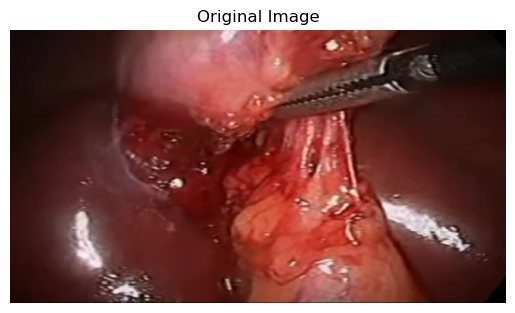

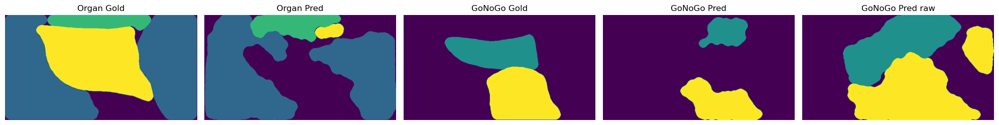

image_test tensor(0.) tensor(1.0000)


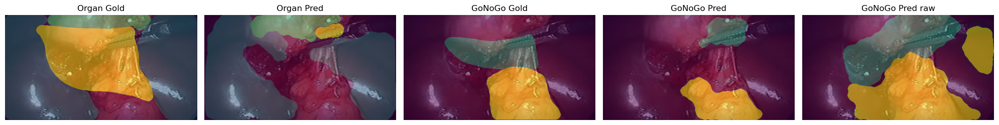

Go-nogo masks hatched


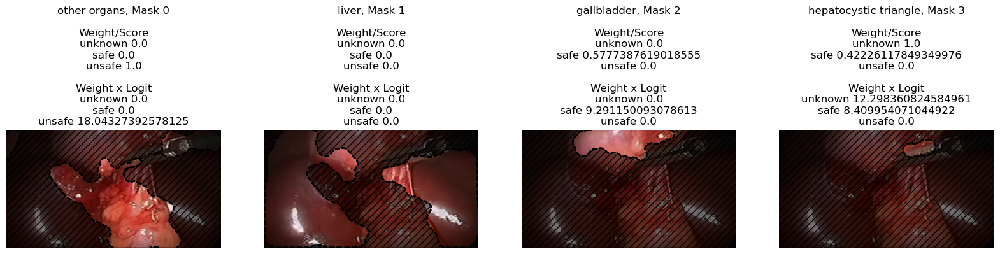

organ x gonogo hatched


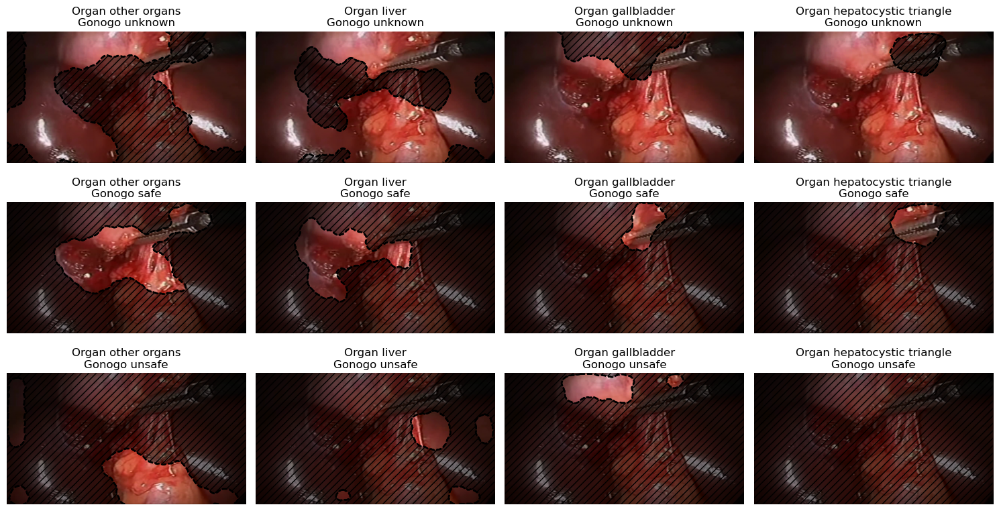

Pred gonogo masks hatched


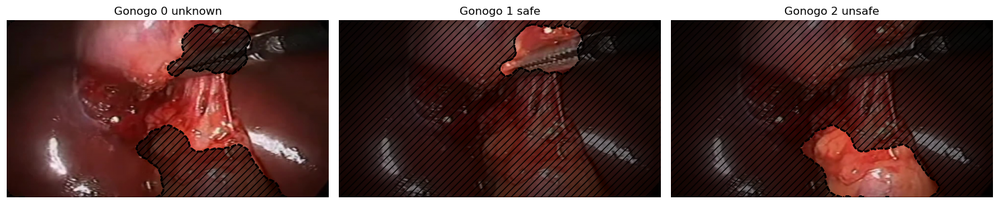

In [58]:
save_mask_user_study(0)

## Show mask playground

In [108]:
def show_mask_weights(i):
    ORGANS = ['other organs', 'liver', 'gallbladder', 'hepatocystic triangle']
    GONOGO = ['unknown', 'safe', 'unsafe']
    inputs_test = test_dataset[i]
    image_test, organ_label_test, gonogo_label_test = inputs_test
    print(image_test.shape, organ_label_test.shape, gonogo_label_test.shape)
    with torch.no_grad():
        outputs = model(image_test.unsqueeze(0).to(device), return_dict=True)
    organ_output = outputs['organ_output']
    gonogo_output = outputs['gonogo_output']
    weighted_prob = (torch.softmax(gonogo_output.logits_all, dim=2) * gonogo_output.mask_weights[:,:,:,None,None]).sum(dim=1)
    gonogo_output_raw = model.gonogo_model(image_test.unsqueeze(0).to(device))
    organ_mask_output = organ_output.logits.argmax(dim=1).byte()
    organ_mask_output.shape
    gonogo_mask_output = gonogo_output.logits.argmax(dim=1).byte()
    gonogo_mask_output.shape
    gonogo_mask_output_raw = gonogo_output_raw.logits.argmax(dim=1).byte()
    gonogo_mask_output_raw.shape
    gonogo_mask_output_weighted_prob = weighted_prob.argmax(dim=1).byte()
    gonogo_mask_output_weighted_prob.shape
    
    gonogo_mask_output_only_gonogo = (gonogo_output.logits[:,1:].argmax(dim=1) + 1) * \
        (gonogo_output.logits[:,1:].sum(1) > 0.0001).byte()
    gonogo_mask_output_only_gonogo_prob = (weighted_prob[:,1:].argmax(dim=1) + 1) * \
        (weighted_prob[:,1:].sum(1) > 0.0001).byte()
    
    
    # show original image
    plt.imshow(image_test.permute(1,2,0).cpu().numpy())
    plt.title('Original Image')
    plt.axis('off')
    
    fig, axes = plt.subplots(1, 8, figsize=(20, 4))  # 1 row, 5 columns
    

    # show gold organ label
    axes[0].imshow(organ_label_test.permute(1,2,0).cpu().numpy())
    axes[0].set_title('Organ Gold')
    axes[0].axis('off')

    # show organ pred
    axes[1].imshow(organ_mask_output.permute(1,2,0).cpu().numpy())
    axes[1].set_title('Organ Pred')
    axes[1].axis('off')
    
     # show gold gonogo label
    axes[2].imshow(gonogo_label_test.permute(1,2,0).cpu().numpy())
    axes[2].set_title('GoNoGo Gold')
    axes[2].axis('off')

    # show gonogo pred
    axes[3].imshow(gonogo_mask_output.permute(1,2,0).cpu().numpy())
    axes[3].set_title('GoNoGo Pred')
    axes[3].axis('off')
    
    # show gonogo pred raw
    axes[4].imshow(gonogo_mask_output_raw.permute(1,2,0).cpu().numpy())
    axes[4].set_title('GoNoGo Pred raw')
    axes[4].axis('off')
    
    # show gonogo pred
    axes[5].imshow(gonogo_mask_output_weighted_prob.permute(1,2,0).cpu().numpy())
    axes[5].set_title('GoNoGo Pred softmax')
    axes[5].axis('off')
    
    # show gonogo pred raw
    axes[6].imshow(gonogo_mask_output_only_gonogo.permute(1,2,0).cpu().numpy())
    axes[6].set_title('GoNoGo Pred weighted  only gonogo')
    axes[6].axis('off')
    
    axes[7].imshow(gonogo_mask_output_only_gonogo_prob.permute(1,2,0).cpu().numpy())
    axes[7].set_title('GoNoGo Pred weighted  only gonogo prob')
    axes[7].axis('off')

    plt.tight_layout()
    plt.show()


    print('Go-nogo masks')

    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        axes[i].imshow(gonogo_output.masks[0][i].cpu().numpy())
        mask_weight = gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()
        axes[i].set_title(f'Mask {i}, Weight/Score {mask_weight}')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
    
    print('Go-nogo masks hatched')

    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = gonogo_output.masks[0][i]
        plot_hatch(image_test.permute(1,2,0), mask.cpu(), axes[i], c=0.5)
        mask_weight = gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()
        mask_weight_show = "\n".join([f'{GONOGO[j]} {mask_weight[j]}' for j in range(len(mask_weight))])
        axes[i].set_title(f'{ORGANS[i]}, Mask {i}\nWeight/Score\n{mask_weight_show}')
        axes[i].axis('off')
    
    print('Gold organs masks hatched')

    num_masks = len(gonogo_output.mask_weights[0])
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    # print('organ_label_test', organ_label_test.shape)
    # print(organ_label_test[0])
    # print(organ_label_test[0].max())
    for i in range(num_masks):
        mask = (organ_label_test[0] == i).int()
        plot_hatch(image_test.permute(1,2,0), mask.cpu(), axes[i], c=0.5)
        axes[i].set_title(f'Organ {i} {ORGANS[i]}')
        axes[i].axis('off')
        
    print('Gold gonogo masks hatched')

    num_masks = 3
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = (gonogo_label_test[0] == i).int()
        plot_hatch(image_test.permute(1,2,0), mask.cpu(), axes[i], c=0.5)
        axes[i].set_title(f'Gonogo {i} {GONOGO[i]}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
    
    print('Pred gonogo masks hatched')

    num_masks = 3
    fig, axes = plt.subplots(1, num_masks, figsize=(5*num_masks, 4))  # Adjust figsize accordingly

    for i in range(num_masks):
        mask = (gonogo_mask_output[0] == i).int()
        plot_hatch(image_test.permute(1,2,0), mask.cpu(), axes[i], c=0.5)
        axes[i].set_title(f'Gonogo {i} {GONOGO[i]}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
        
    print('organ x gonogo hatched')
    
    num_og = 4
    num_gng = 3
    fig, axes = plt.subplots(num_gng, num_og, figsize=(5*num_gng, 2*num_og))  # Adjust figsize accordingly
    
    for i_og in range(num_og):
        for i_gng in range(num_gng):
            mask = gonogo_output.logits_all[0,i_og,i_gng]
            plot_hatch(image_test.permute(1,2,0), mask.cpu(), axes[i_gng][i_og], c=0.5)
            axes[i_gng][i_og].set_title(f'Organ {ORGANS[i_og]}\nGonogo {GONOGO[i_gng]}')
            axes[i_gng][i_og].axis('off')
        
    plt.tight_layout()
    plt.show()
    
    print('weighted organ masks')
    for i in range(4):
        for j in range(3):
            fig, axes = plt.subplots(1, 3, figsize=(5*3, 4))
            im0 = axes[0].imshow(gonogo_output.logits_all[0][i][j].cpu(), vmin=0, vmax=1)
            axes[0].set_title(f'organ {i} {ORGANS[i]}, gonogo {j} {GONOGO[j]}\nPred')
            im1 = axes[1].imshow((gonogo_output.logits_all * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j].cpu(), vmin=0, vmax=1)
            axes[1].set_title(f'organ {i} {ORGANS[i]}, gonogo {j} {GONOGO[j]}\nWeighted Pred')
            im2 = axes[2].imshow((gonogo_output.masks.unsqueeze(2) * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j].cpu(), vmin=0, vmax=1)
            axes[2].set_title(f'organ {i} {ORGANS[i]}, gonogo {j} {GONOGO[j]}\nWeighted Input Organ')
            fig.colorbar(im0, ax=axes[0])
            fig.colorbar(im1, ax=axes[1])
            fig.colorbar(im2, ax=axes[2])
            plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 352, 640]) torch.Size([1, 352, 640]) torch.Size([1, 352, 640])


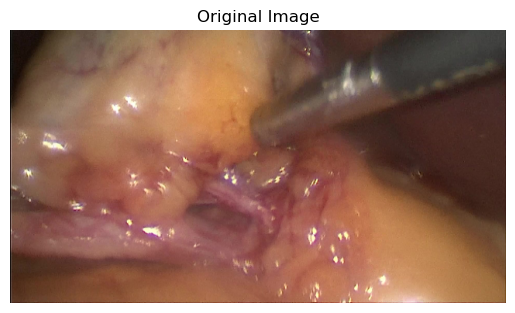

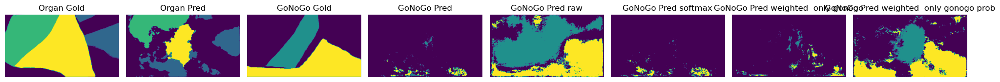

Go-nogo masks


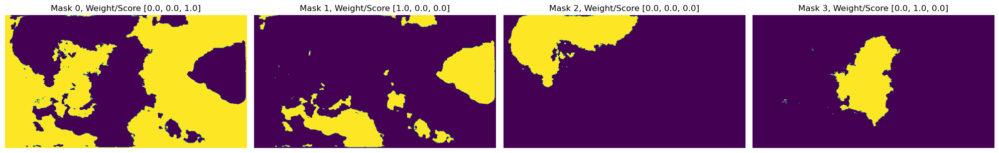

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Go-nogo masks hatched
Gold organs masks hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Gold gonogo masks hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


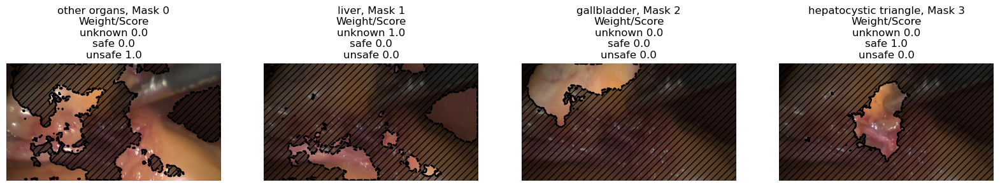

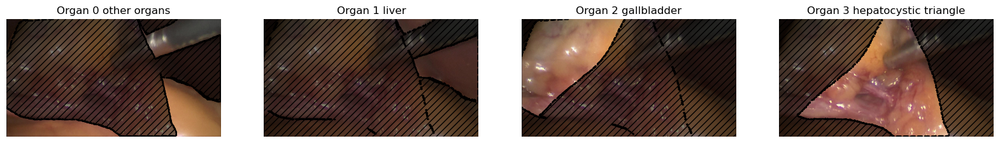

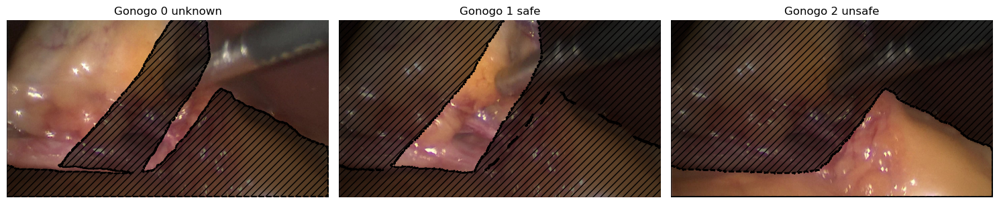

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Pred gonogo masks hatched


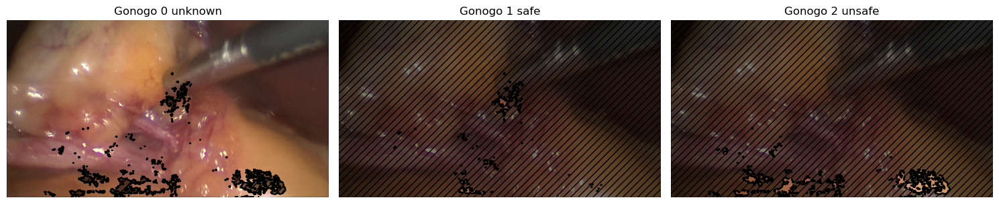

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


organ x gonogo hatched


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

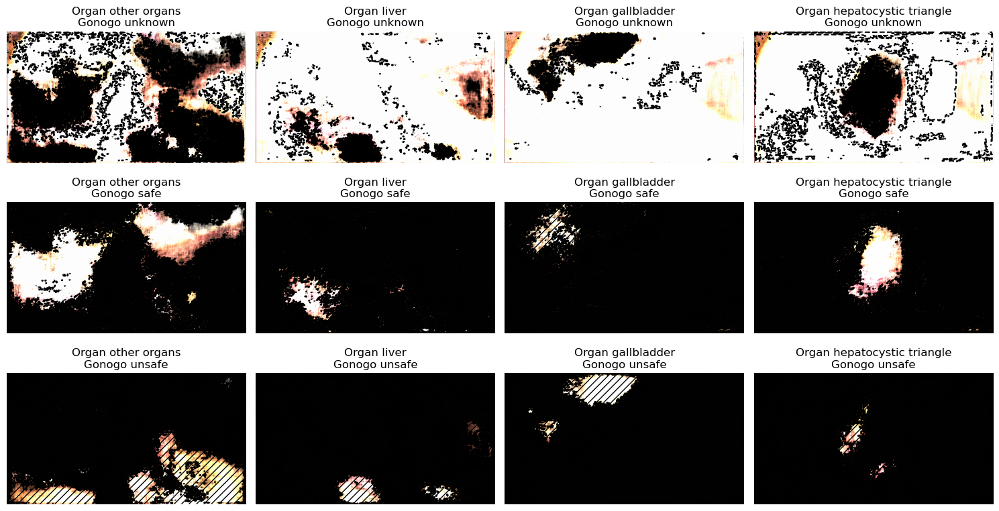

weighted organ masks


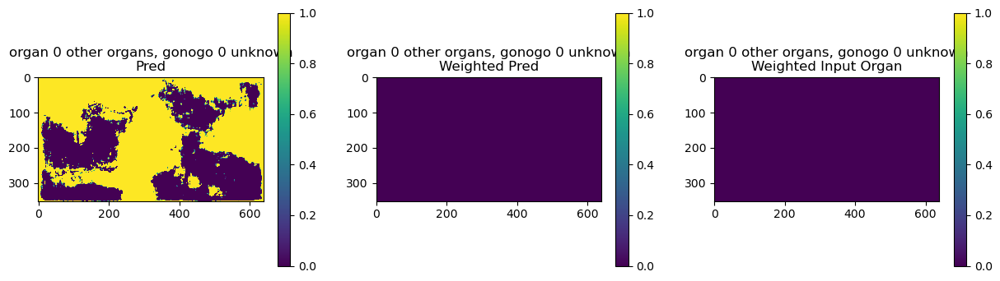

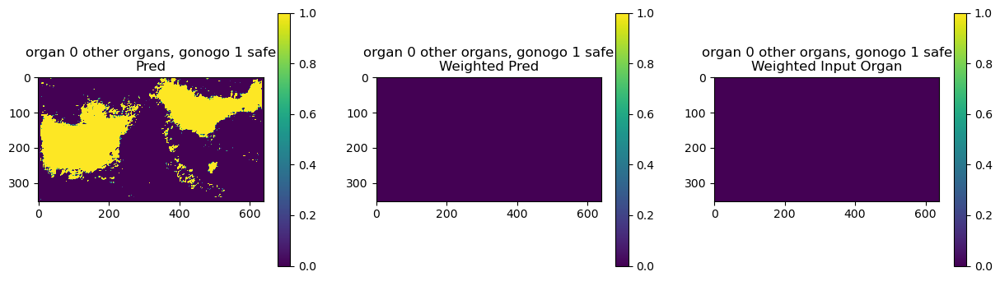

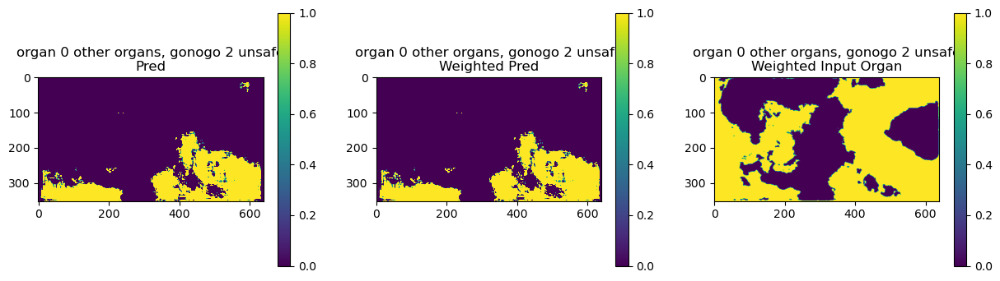

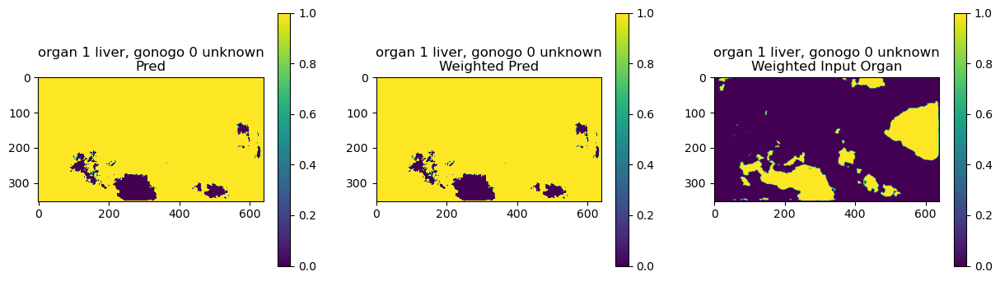

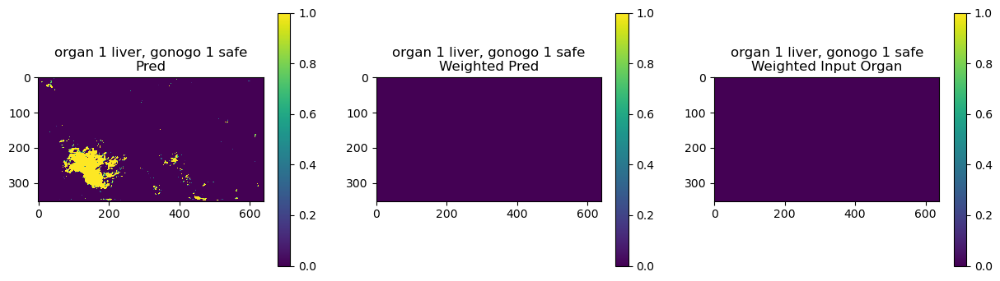

...

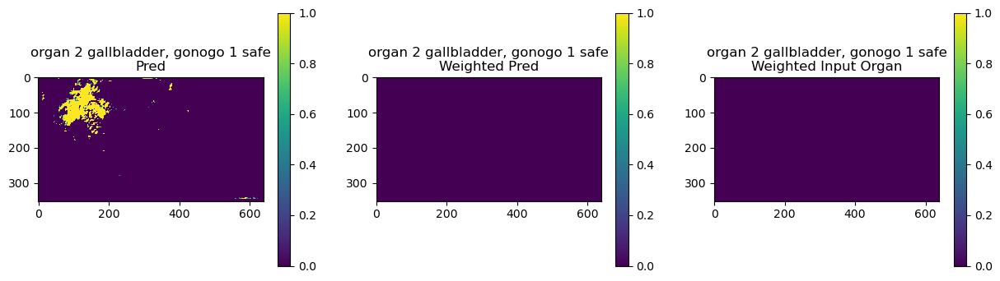

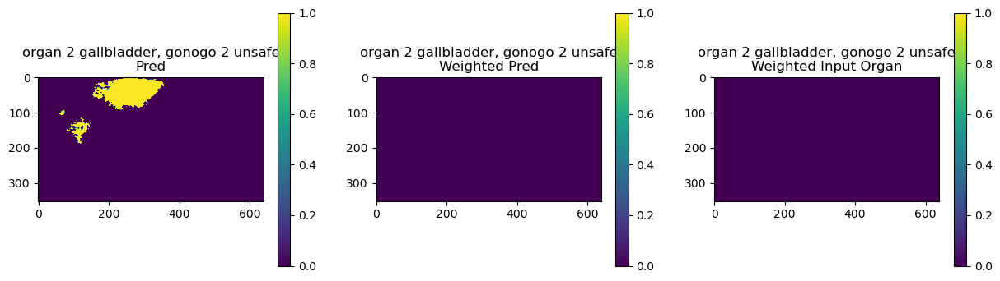

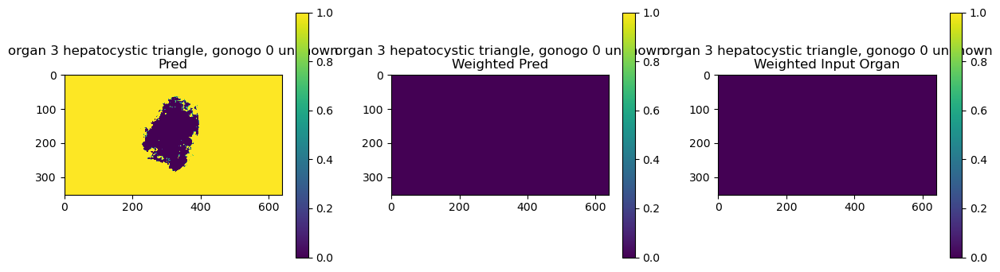

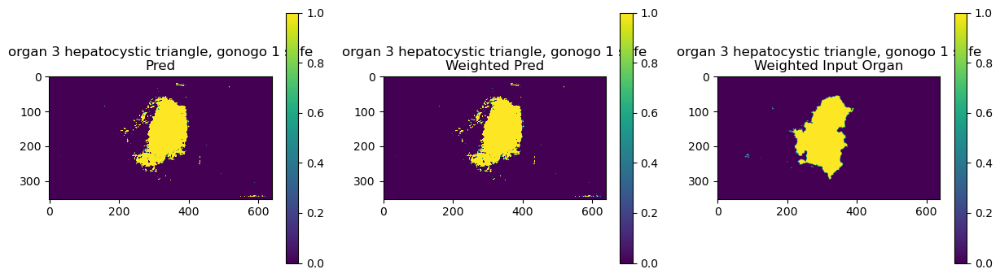

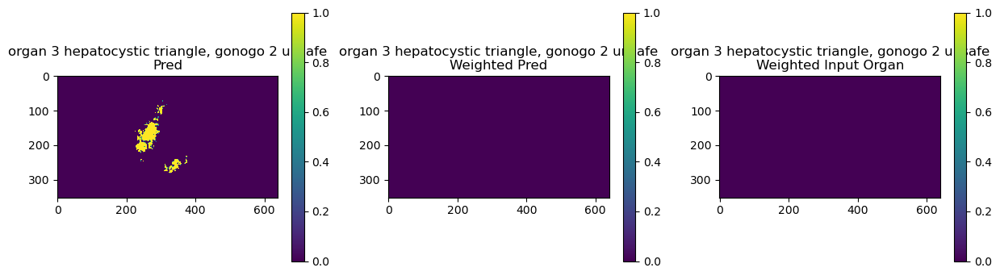

In [109]:
show_mask_weights(300)

## Playground

In [9]:
inputs_test = test_dataset[100]
image_test, organ_label_test, gonogo_label_test = inputs_test

with torch.no_grad():
    outputs = model(image_test.unsqueeze(0), return_dict=True)

In [10]:
organ_output = outputs['organ_output']
gonogo_output = outputs['gonogo_output']
organ_mask_output = organ_output.logits.argmax(dim=1).byte()
organ_mask_output.shape
gonogo_mask_output = gonogo_output.logits.argmax(dim=1).byte()
gonogo_mask_output.shape

torch.Size([1, 352, 640])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


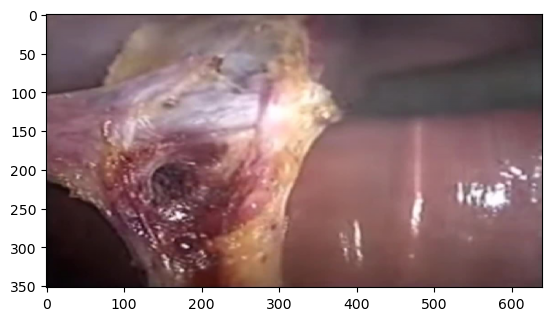

In [11]:
plt.imshow(image_test.permute(1,2,0).cpu().numpy())

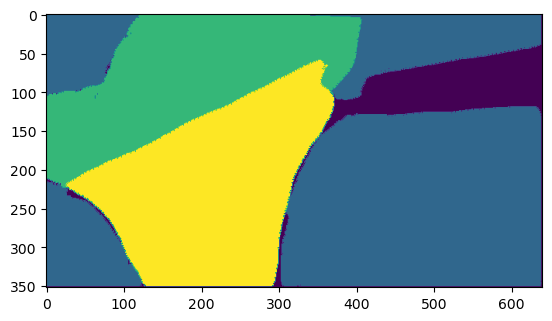

In [12]:
plt.imshow(organ_label_test.permute(1,2,0).cpu().numpy())

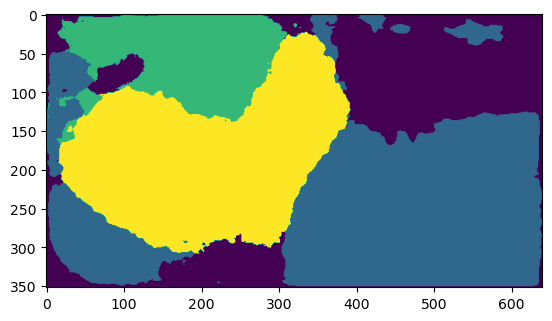

In [13]:
plt.imshow(organ_mask_output.permute(1,2,0).cpu().numpy())

In [14]:
(organ_mask_output == 3).sum()

tensor(61590)

In [15]:
gonogo_output.logits_all.shape, gonogo_output.mask_weights.shape, gonogo_output.masks.shape

(torch.Size([1, 4, 3, 352, 640]),
 torch.Size([1, 4, 3]),
 torch.Size([1, 4, 352, 640]))

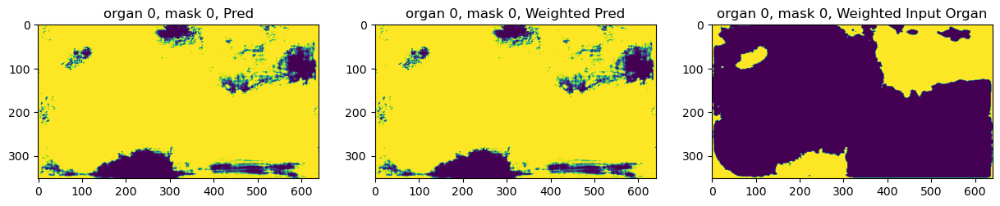

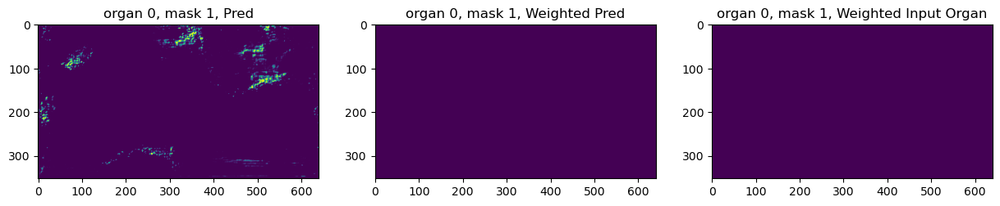

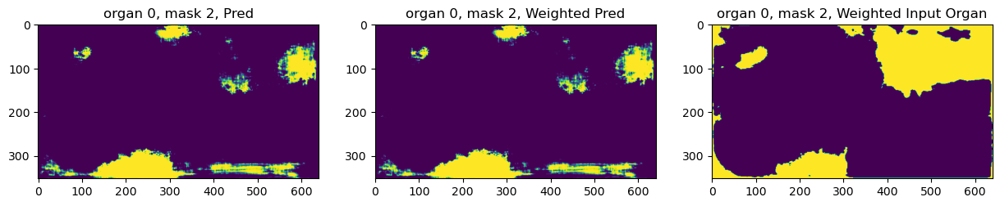

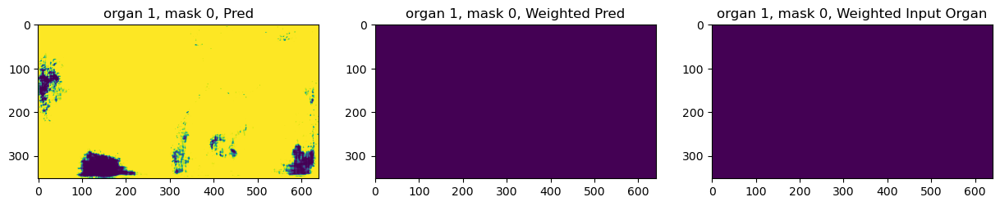

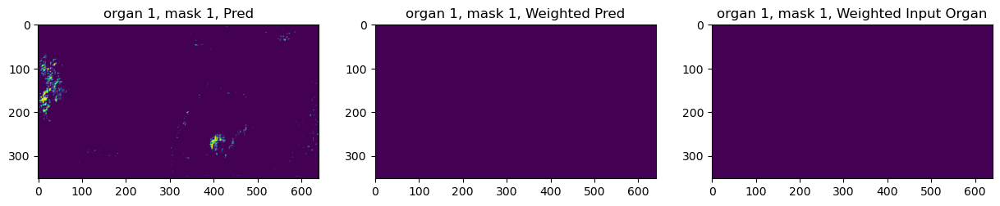

...

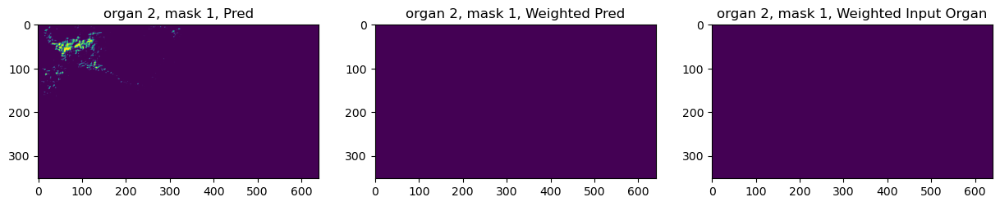

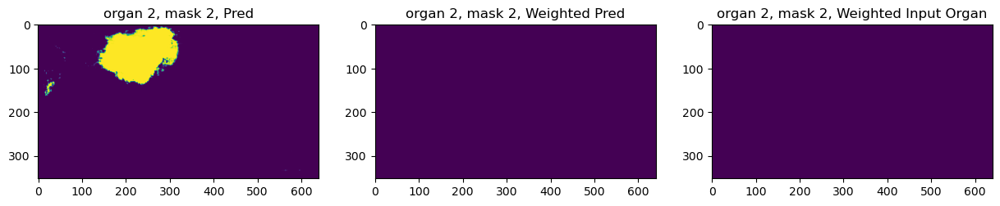

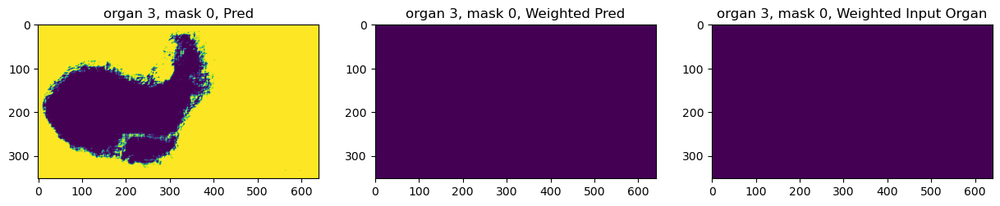

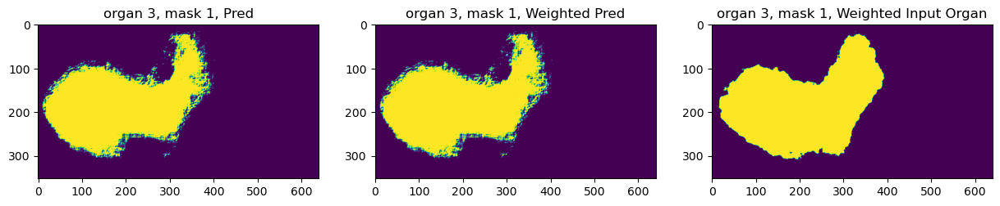

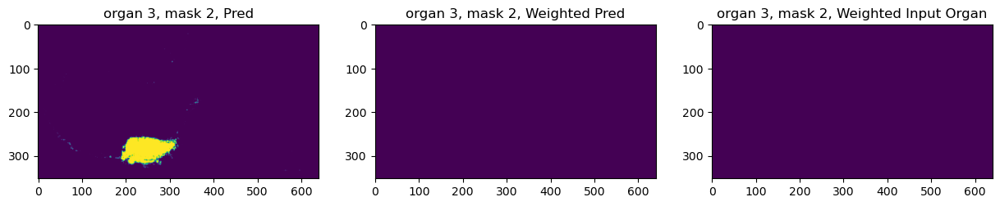

In [16]:
for i in range(4):
    for j in range(3):
        fig, axes = plt.subplots(1, 3, figsize=(5*3, 4))
        axes[0].imshow(gonogo_output.logits_all[0][i][j], vmin=0, vmax=1)
        axes[0].set_title(f'organ {i}, mask {j}, Pred')
        axes[1].imshow((gonogo_output.logits_all * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j], vmin=0, vmax=1)
        axes[1].set_title(f'organ {i}, mask {j}, Weighted Pred')
        axes[2].imshow((gonogo_output.masks.unsqueeze(2) * gonogo_output.mask_weights.unsqueeze(-1).unsqueeze(-1))[0][i][j], vmin=0, vmax=1)
        axes[2].set_title(f'organ {i}, mask {j}, Weighted Input Organ')
        plt.show()

In [17]:
i = 0
j = 1
gonogo_output.logits_all[0][i][j], gonogo_output.logits_all[0][i][j].min(), gonogo_output.logits_all[0][i][j].max()

(tensor([[1.6586e-06, 1.7263e-07, 7.4571e-08,  ..., 1.6429e-09, 2.0314e-08,
          2.1665e-06],
         [4.1594e-06, 4.7294e-07, 1.0415e-07,  ..., 2.7599e-09, 5.1753e-07,
          1.0039e-04],
         [5.7445e-07, 4.7617e-07, 2.5994e-07,  ..., 4.9377e-10, 3.3181e-08,
          1.2086e-06],
         ...,
         [2.2116e-07, 3.3015e-06, 7.0352e-09,  ..., 1.2794e-03, 9.8183e-03,
          1.2011e-03],
         [4.5274e-11, 4.3307e-12, 1.9147e-12,  ..., 2.9291e-10, 6.0729e-09,
          2.9674e-06],
         [2.1305e-05, 1.4911e-04, 8.1975e-05,  ..., 7.1722e-05, 5.4018e-03,
          4.5113e-04]]),
 tensor(1.5586e-33),
 tensor(1.0000))

In [18]:
gonogo_output.logits_all[0][0][1][90][80], gonogo_output.logits_all[0][3][1][90][80]

(tensor(0.3428), tensor(3.3182e-13))

In [19]:
gonogo_output.logits_all[0][0][2][90][80], gonogo_output.logits_all[0][3][2][90][80]

(tensor(0.0033), tensor(1.2207e-21))

In [20]:
gonogo_output.logits_all[0][0][0][90][80], gonogo_output.logits_all[0][3][0][90][80]

(tensor(0.6538), tensor(1.))

In [21]:
i = 3
j = 1
gonogo_output.logits_all[0][i][j], gonogo_output.logits_all[0][i][j].min(), gonogo_output.logits_all[0][i][j].max()

(tensor([[2.2869e-07, 1.2421e-07, 1.9232e-09,  ..., 1.5367e-08, 3.5802e-08,
          2.3575e-06],
         [3.8704e-09, 1.8379e-09, 3.1876e-12,  ..., 2.9344e-09, 1.3827e-07,
          8.9601e-06],
         [1.1547e-09, 3.4834e-10, 4.6471e-13,  ..., 2.7109e-11, 5.3628e-09,
          1.4725e-06],
         ...,
         [2.6991e-09, 1.1285e-07, 4.2250e-10,  ..., 6.1462e-12, 4.0470e-09,
          1.0687e-05],
         [8.1127e-12, 4.9569e-11, 1.2201e-12,  ..., 1.1052e-14, 6.0467e-11,
          6.9449e-06],
         [3.5782e-05, 1.6442e-03, 8.0151e-05,  ..., 1.7861e-06, 7.6961e-05,
          9.0002e-04]]),
 tensor(6.3132e-22),
 tensor(1.))

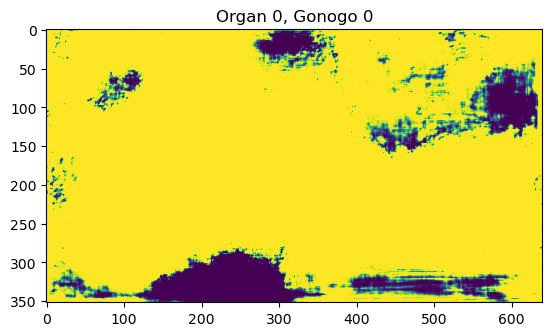

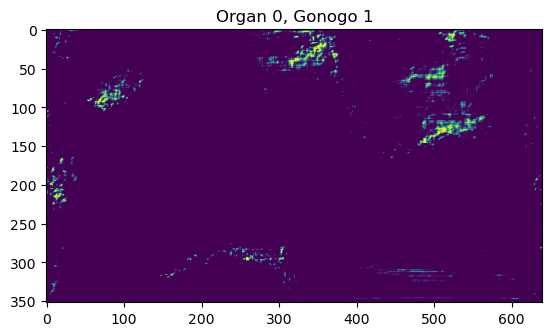

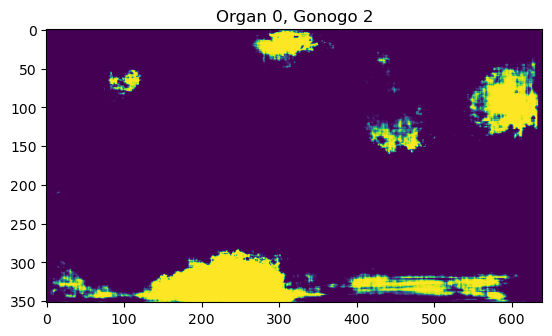

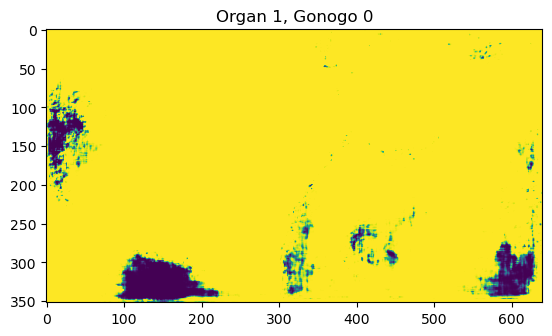

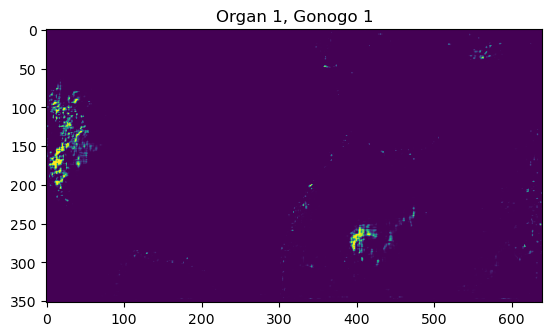

...

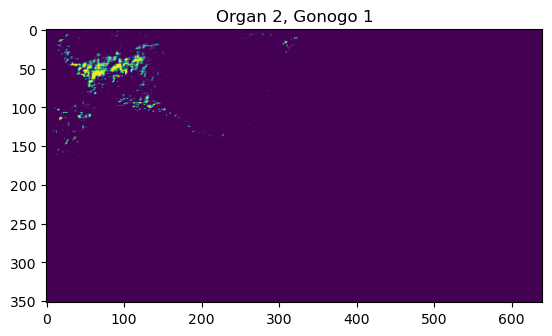

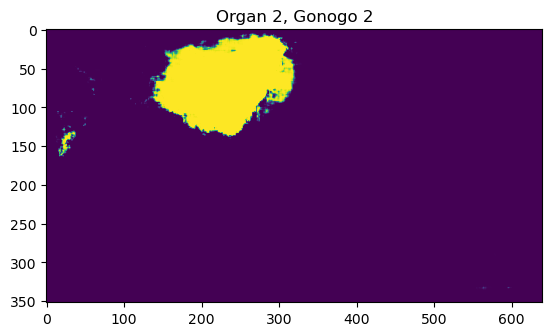

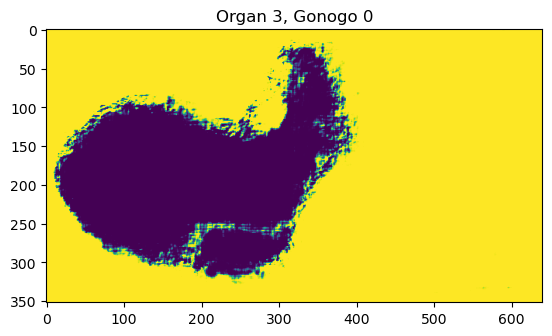

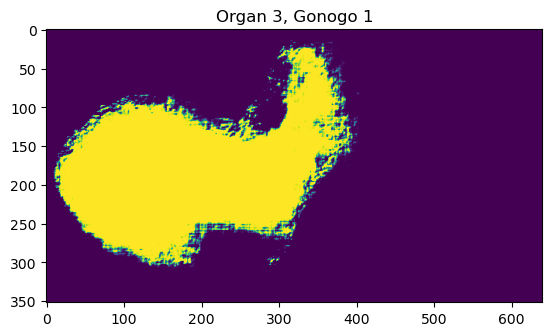

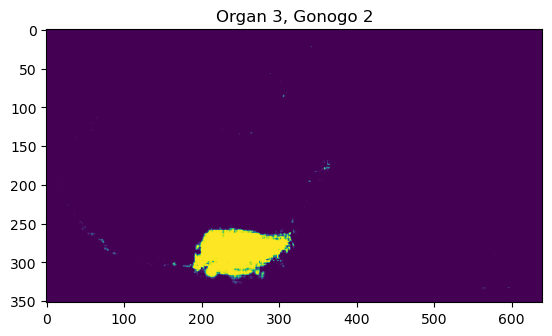

In [22]:
for i_og in range(4):
    for i_gng in range(3):
        plt.figure()
        plt.imshow(gonogo_output.logits_all[0,i_og,i_gng].cpu().numpy())
        plt.title(f'Organ {i_og}, Gonogo {i_gng}')
        plt.show()

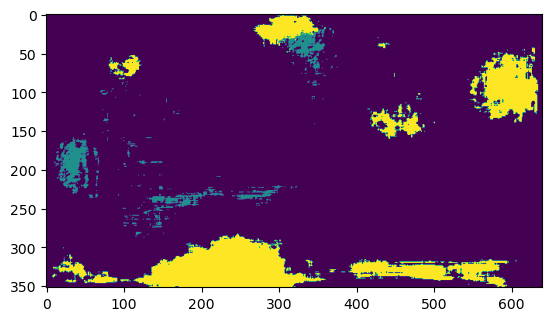

In [23]:
plt.imshow(gonogo_mask_output.permute(1,2,0).cpu().numpy())

In [24]:
gonogo_output.mask_weights, gonogo_output.mask_weights.shape

(tensor([[[1., 0., 1.],
          [0., 0., 0.],
          [0., 0., 0.],
          [0., 1., 0.]]]),
 torch.Size([1, 4, 3]))

In [25]:
gonogo_output.masks.shape

torch.Size([1, 4, 352, 640])

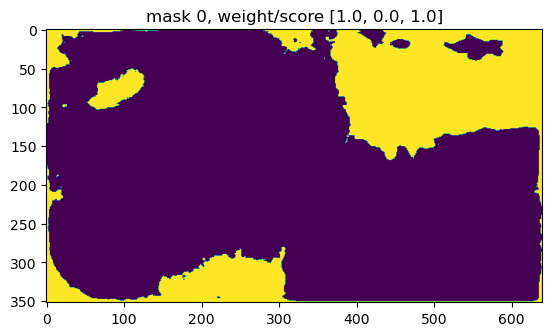

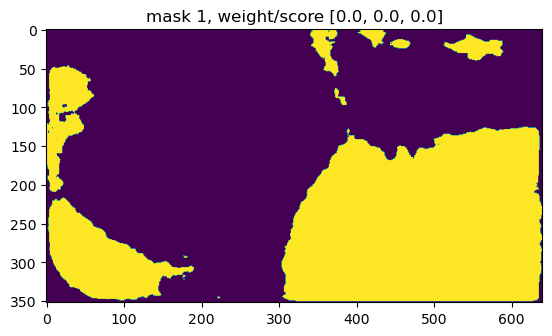

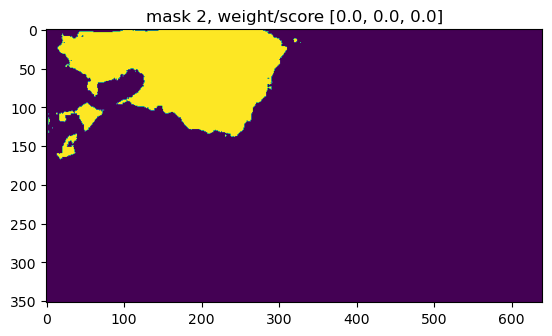

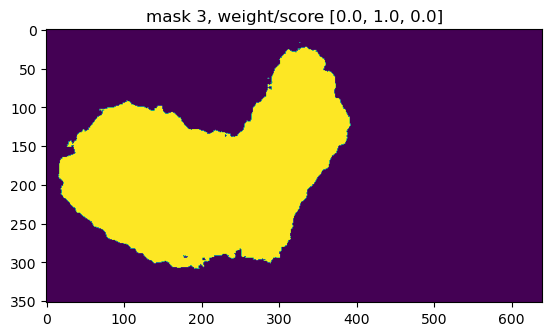

In [26]:
for i in range(len(gonogo_output.mask_weights[0])):
    plt.figure()
    plt.imshow(gonogo_output.masks[0][i].cpu().numpy())
    plt.title(f'mask {i}, weight/score {gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()}')
    plt.show()

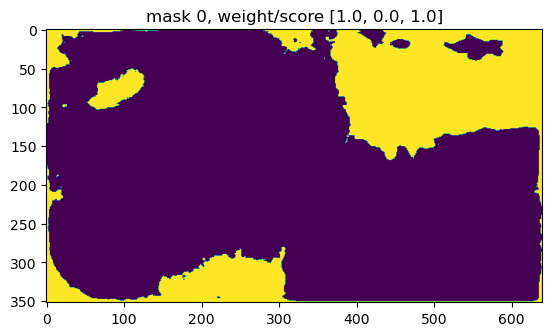

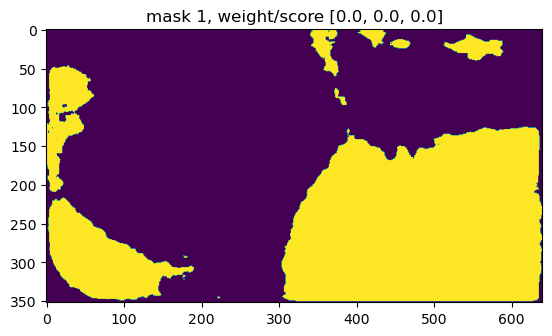

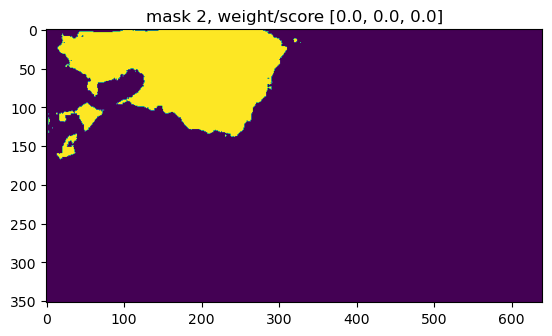

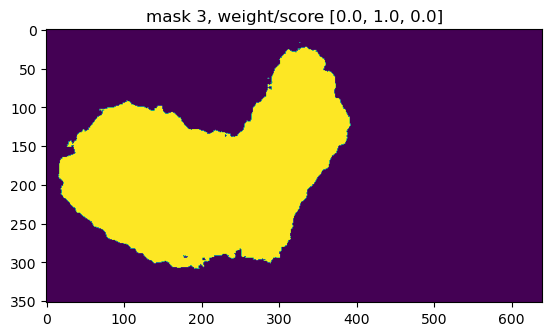

In [27]:
for i in range(len(gonogo_output.mask_weights[0])):
    plt.figure()
    plt.imshow((organ_mask_output == i).permute(1,2,0).cpu().numpy())
    plt.title(f'mask {i}, weight/score {gonogo_output.mask_weights[0][i].detach().cpu().numpy().tolist()}')
    plt.show()

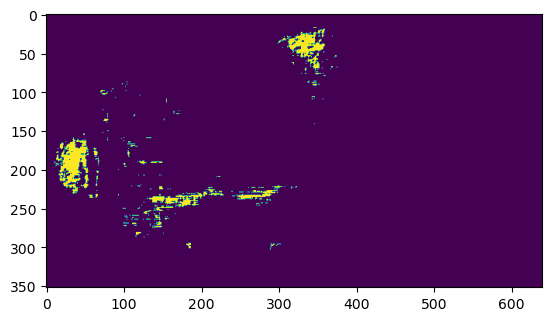

In [28]:
plt.imshow((gonogo_mask_output == 1).permute(1,2,0).cpu().numpy())

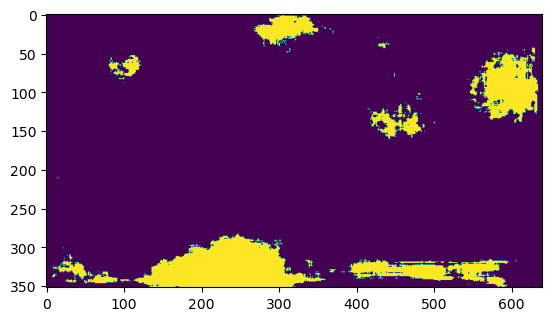

In [29]:
plt.imshow((gonogo_mask_output == 2).permute(1,2,0).cpu().numpy())

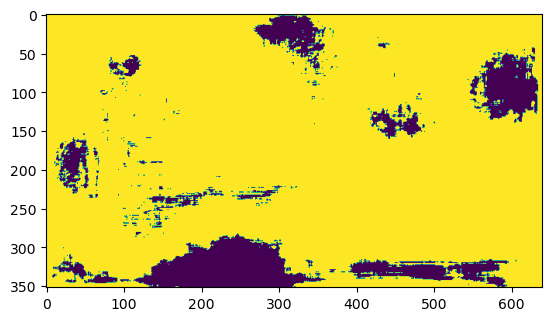

In [30]:
plt.imshow((gonogo_mask_output == 0).permute(1,2,0).cpu().numpy())